# **1) EXPLORATIVE DATA ANALYSIS**

---


Importing the libraries.

In [45]:
import warnings
warnings.filterwarnings('ignore')
import numpy as np
import os
import random


In [46]:
# Graphics Libs
import matplotlib.pyplot as plt
%matplotlib inline
plt.rcParams['figure.figsize'] = 18, 8

In [47]:
# Images Processing Libs
from skimage import io
import cv2
from skimage.segmentation import slic
from skimage.segmentation import mark_boundaries
from skimage.util import img_as_float

In [48]:
# Models Libs
import torch
import torch.nn as nn
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
from torch.nn import functional as F
from torch.nn import BCEWithLogitsLoss
from torch.optim import Adam
from torch.utils.data import DataLoader
from torchvision.transforms import CenterCrop
from torch.utils.data import Dataset
from tqdm import tqdm
from sklearn.model_selection import train_test_split
if torch.backends.mps.is_available():
    device = 'mps'
elif torch.cuda.is_available():
    device = 'cuda'
else:
    device = 'cpu'
print('Current Device is: ', device.upper())

Current Device is:  MPS


Defining helper function.

In [49]:
def center_crop(img, dim):
	"""Returns center cropped image
	Args:
	img: Image to be center cropped
	dim: Dimensions (width, height) to be cropped
	"""
	width, height = img.shape[1], img.shape[0]
	crop_width = dim[0] if dim[0] < img.shape[1] else img.shape[1]
	crop_height = dim[1] if dim[1] < img.shape[0] else img.shape[0]
	mid_x, mid_y = int(width/2), int(height/2)
	cw2, ch2 = int(crop_width/2), int(crop_height/2)
	crop_img = img[mid_y-ch2:mid_y+ch2, mid_x-cw2:mid_x+cw2]
	return crop_img

In [50]:
def merge_labels(mask):
	"""Returns the labels image in which the classes are merged in Weed/NotWeed
	Args:
	mask: Dataset provided mask
	"""
	mask_merged = np.zeros((mask.shape[0], mask.shape[1], 1), dtype='uint8')
	for i in range(mask.shape[0]):
		for j in range(mask.shape[1]):
			if mask[i][j].any():
				mask_merged[i][j] = 255
	return mask_merged

In [51]:
def get3Dmask(mask):
	"""Returns a RGB mask given a binary mask
	Args:
	mask: Black and White mask
	"""
	colored_mask = np.zeros((mask.shape[0], mask.shape[1], 3), dtype='uint8')
	for i in range(mask.shape[0]):
		for j in range(mask.shape[1]):
			if mask[i][j] != 0:
				colored_mask[i][j] = [0, 255, 0]
	return colored_mask

In [52]:
def get2Dmask(mask):
	"""Returns a binary mask given a RGB mask
	Args:
	mask: RGB mask
	"""
	binary_mask = np.zeros((mask.shape[0], mask.shape[1]), dtype='uint8')
	for i in range(mask.shape[0]):
		for j in range(mask.shape[1]):
			if mask[i][j].any():
				binary_mask[i][j] = 255
	return binary_mask

In [53]:
def applyGreenFilter(img):
	"""Returns a masked image in which the background is removed and green channel is 'highlighted'
	Args:
	img: RGB image to which apply the filter
	"""
	hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
	mask = cv2.inRange(hsv, (26, 10, 30), (97, 100, 255))
	return cv2.bitwise_or(img, img, mask=mask)

Defining paths and get sample.

In [54]:
TRAIN_BASE_PATH = '../data/raw/datasets/training/'
TRAIN_DATA_PATH = [
    'Field_A/Ses1/',
    'Field_A/Ses2/',
    'Field_A/Ses3/',
    'Field_A/Ses4/',
    'Field_B/Ses1/',
    'Field_B/Ses2/',
]
TEST_DATA_PATH = '../data/raw/datasets/testing/weedmap/Tiles/RedEdge/003/tile/RGB/'
BEST_MODEL = 'https://cdn.albertovalerio.com/datasets/crop_segmentation/models/my_unet_model.pth'
PROCESSED = [
    '../data/processed/datasets_processed/testing_data/',
    '../data/processed/datasets_processed/testing_labels/'
]

In [55]:
sample = 12
ko = '.DS_Store'
train_f = []
for i in TRAIN_DATA_PATH:
    path = TRAIN_BASE_PATH + i
    files = os.listdir(path)
    if ko in files: files.remove(ko)
    train_f += [path + f for f in files]
test_f = os.listdir(TEST_DATA_PATH)
if ko in test_f: test_f.remove(ko)
train_sample = [io.imread(i) for i in random.sample(train_f, sample)]
test_sample = [io.imread(TEST_DATA_PATH + i) for i in random.sample(test_f, sample)]

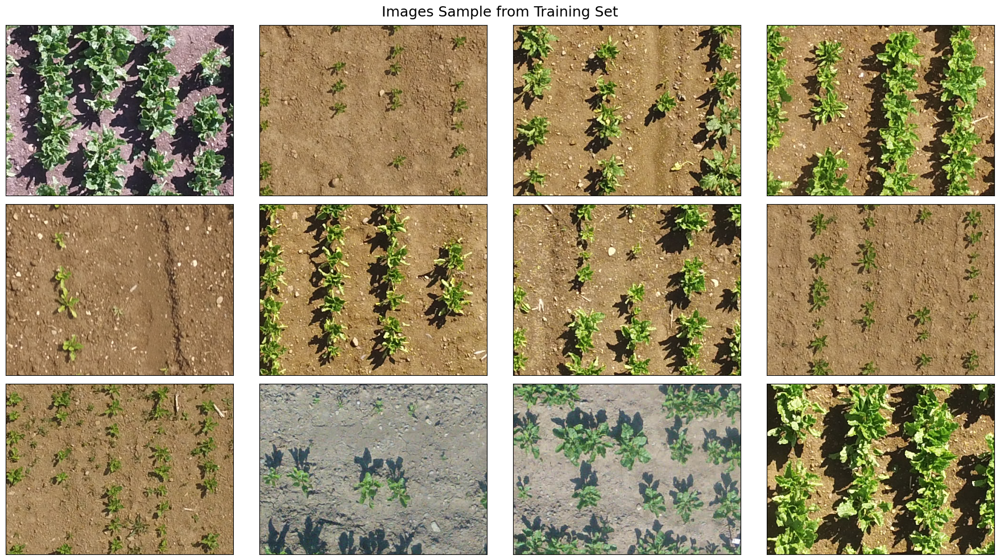

In [56]:
fig, axs = plt.subplots(3, 4, figsize=(18, 10))
fig.suptitle('Images Sample from Training Set', fontsize=18)
for i, ax in enumerate(fig.axes):
    ax.imshow(center_crop(train_sample[i], (480, 360)))
    ax.set_xticks([])
    ax.set_yticks([])
plt.tight_layout()
plt.show()

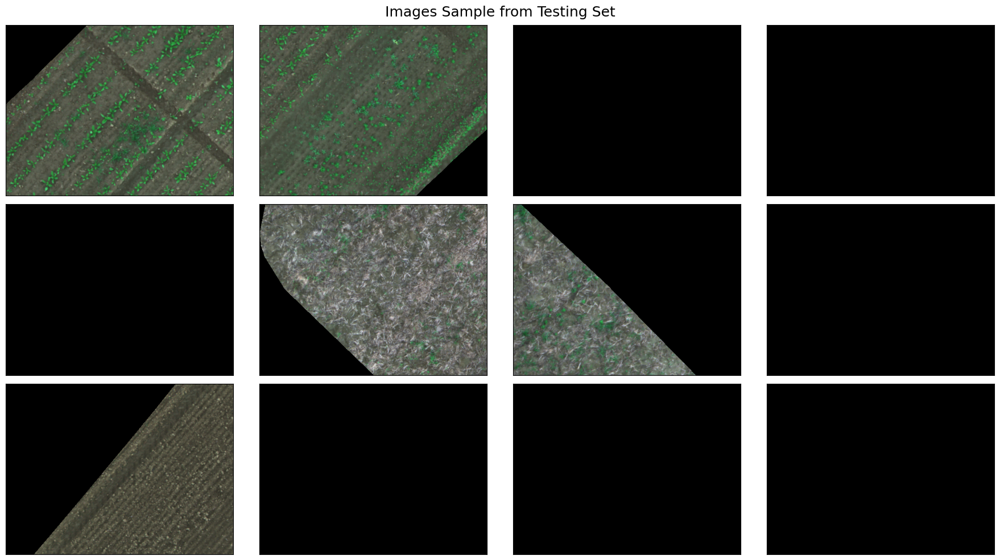

In [57]:
fig, axs = plt.subplots(3, 4, figsize=(18, 10))
fig.suptitle('Images Sample from Testing Set', fontsize=18)
for i, ax in enumerate(fig.axes):
    ax.imshow(test_sample[i])
    ax.set_xticks([])
    ax.set_yticks([])
plt.tight_layout()
plt.show()

# **2) TRADITIONAL APPROACHES**

---


Defining the functions representing the traditional approaches:

- K-mean algorithm
- thresholding, aka the Otsu's algorithm
- Simple Linear Iterative Clustering (SLIC)

In [58]:
def clustering_segmentation(img):
    """Applies image segmentation based on k-Means clustering algorithm
	Args:
	img: RGB image
	Returns:
	segmented: Segmented image in which all pixels are of the color of the centroid
	mask: Black and Green mask (Black=NoCrops, Green=Crops)
    """
    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.2)
    k = 2
    img = cv2.blur(img, ksize = (15, 15))
    _, labels, (centers) = cv2.kmeans(np.float32(img.reshape((-1, 3))), k, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)
    # convert all pixels to the color of the centroids
    centers = np.uint8(centers)
    labels = labels.flatten()
    segmented = centers[labels]
    segmented = segmented.reshape(img.shape)
    mask = np.copy(img)
    mask = mask.reshape((-1, 3))
    u, c = np.unique(labels, return_counts=True)
    if (np.argmax(c) == 0):
        mask[labels == 1] = [0, 255, 0]
        mask[labels == 0] = [0, 0, 0]
    else:
        mask[labels == 1] = [0, 0, 0]
        mask[labels == 0] = [0, 255, 0]
    mask = mask.reshape(img.shape)
    return segmented, get2Dmask(mask)

In [59]:
def thresholding_segmentation(img, rgb=True, inverse=False):
    """Applies image segmentation based on thresholding, aka the Otsu's algorithm
	Args:
	img: Image
    rgb: Whether a given image is RGB or B/W
	Returns:
	threshold: Threshold applied to separate pixel
	mask: Black and Green mask (Black=NoCrops, Green=Crops)
    """
    if rgb:
        img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    img = cv2.blur(img, ksize = (15, 15))
    # OTSU'S ALGORITHM
    hist, bins = np.histogram(img, bins=256)
    # Calculate centers of bins
    bins_mids = (bins[:-1] + bins[1:]) / 2.
    # Iterate over all thresholds (indices) and get the probabilities w1(t), w2(t)
    w1 = np.cumsum(hist)
    w2 = np.cumsum(hist[::-1])[::-1]
    # Get the classes means mu0(t) and mu1(t)
    mean1 = np.cumsum(hist * bins_mids) / w1
    mean2 = (np.cumsum((hist * bins_mids)[::-1]) / w2[::-1])[::-1]
    inter_class_variance = w1[:-1] * w2[1:] * (mean1[:-1] - mean2[1:]) ** 2
    index_of_max_val = np.argmax(inter_class_variance)
    threshold = bins_mids[:-1][index_of_max_val]
    _, mask = cv2.threshold(img, threshold, 255, cv2.THRESH_BINARY_INV if inverse else cv2.THRESH_BINARY)
    return threshold, mask

In [60]:
def slic_segmentation(img, n_segments=100):
    """Applies image segmentation based on SIMPLE LINEAR ITERATIVE CLUSTERING algorithm
	Args:
	img: RGB image
	n_segments: Segments in which divide the image
	Returns:
	segments: Segments found
	boundaries: Image where segment's boundaries are applied
    """
    img = img_as_float(img)
    segments = slic(img, n_segments = n_segments, sigma = 5)
    boundaries = mark_boundaries(img, segments)
    return segments, boundaries

Plotting a sample given by the application of the above algorithms and visually comparing the results.

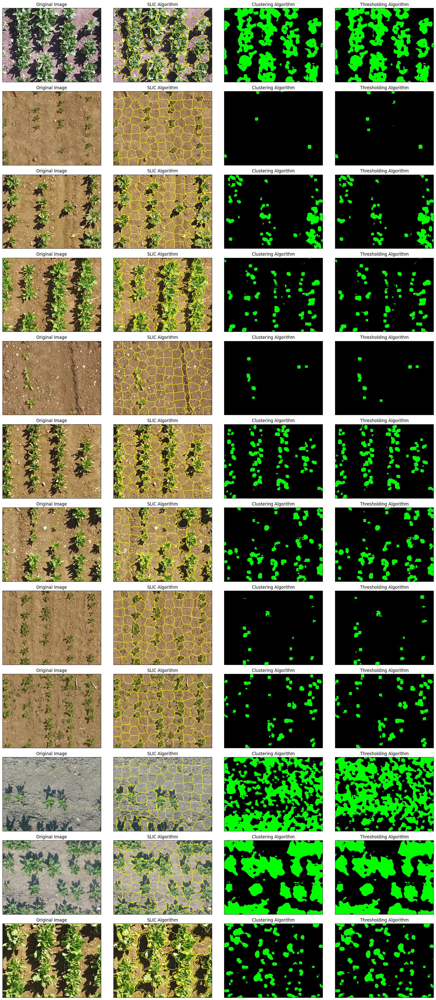

In [61]:
fig, axs = plt.subplots(12, 4, figsize=(18, 40))
for i in range(len(train_sample)):
    img = train_sample[i]
    img = center_crop(img, (480, 360))
    _, boundaries = slic_segmentation(img)
    _, m_cluster = clustering_segmentation(applyGreenFilter(img))
    _, m_threshold = thresholding_segmentation(applyGreenFilter(img))

    fig.axes[i*4].imshow(img)
    fig.axes[i*4+1].imshow(boundaries)
    fig.axes[i*4+2].imshow(get3Dmask(m_cluster))
    fig.axes[i*4+3].imshow(get3Dmask(m_threshold))

    fig.axes[i*4].set_title('Original Image')
    fig.axes[i*4+1].set_title('SLIC Algorithm')
    fig.axes[i*4+2].set_title('Clustering Algorithm')
    fig.axes[i*4+3].set_title('Thresholding Algorithm')

    fig.axes[i*4].set_xticks([])
    fig.axes[i*4].set_yticks([])
    fig.axes[i*4+1].set_xticks([])
    fig.axes[i*4+1].set_yticks([])
    fig.axes[i*4+2].set_xticks([])
    fig.axes[i*4+2].set_yticks([])
    fig.axes[i*4+3].set_xticks([])
    fig.axes[i*4+3].set_yticks([])

plt.tight_layout()
plt.show()

# **DEEP LEARNING APPROACHES**

## Preprocessing

Preprocessing steps (TESTING):
- Merged labels (weed and crop).


---


*Note: see the final report for more details.*

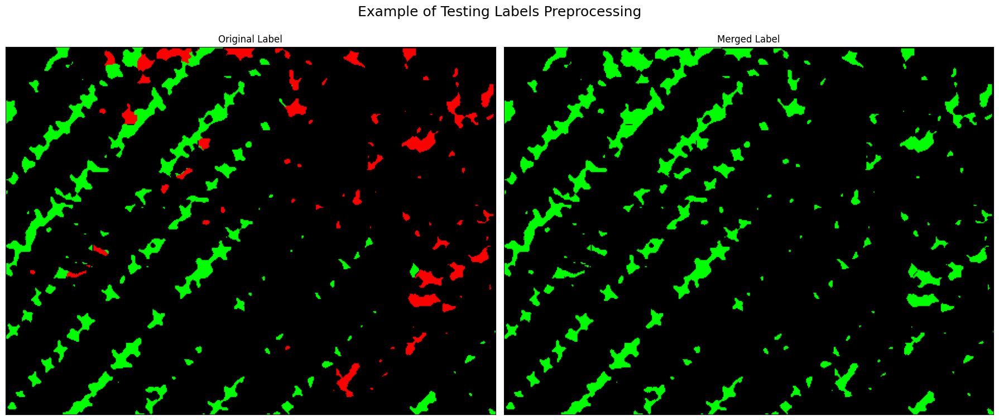

In [62]:
fig, (ax1,ax2) = plt.subplots(1, 2, figsize=(18, 8))
fig.suptitle('Example of Testing Labels Preprocessing', fontsize=18)
path = '../data/raw/datasets/testing/weedmap/Tiles/RedEdge/003/groundtruth/003_frame0020_GroundTruth_color.png'
label = io.imread(path)
label_m = merge_labels(label)
label_m = get3Dmask(label_m)
ax1.imshow(label)
ax2.imshow(label_m)
ax1.set_title('Original Label')
ax2.set_title('Merged Label')
ax1.set_xticks([])
ax1.set_yticks([])
ax2.set_xticks([])
ax2.set_yticks([])
plt.tight_layout()
plt.show()

Preprocessing steps (TRAINING):
- Divided each image in patches.
- Saturated green channel and removed background.
- Applied low level segmentation based on clustering algorithm.
- Applied random black mask.


---


*Note: see the final report for more details.*

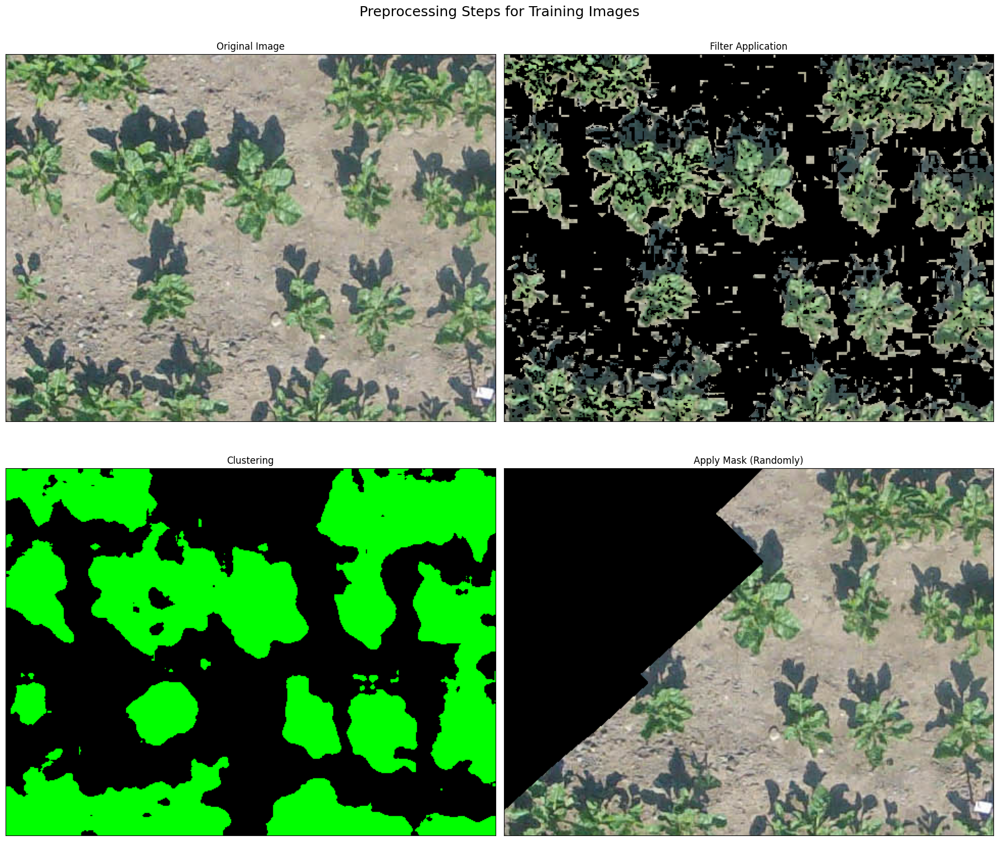

In [63]:
fig, ((ax1,ax2),(ax3,ax4)) = plt.subplots(2, 2, figsize=(18, 16))
fig.suptitle('Preprocessing Steps for Training Images', fontsize=18)
mask = io.imread('../data/raw/datasets/testing/weedmap/Tiles/RedEdge/003/mask/frame0081.png')
img = train_sample[10]
img = center_crop(img, (480, 360))
_, clustered = clustering_segmentation(applyGreenFilter(img))
ax1.imshow(img)
ax2.imshow(applyGreenFilter(img))
ax3.imshow(get3Dmask(clustered))
ax4.imshow(cv2.bitwise_and(img, img, mask=mask))
ax1.set_title('Original Image')
ax2.set_title('Filter Application')
ax3.set_title('Clustering')
ax4.set_title('Apply Mask (Randomly)')
ax1.set_xticks([])
ax1.set_yticks([])
ax2.set_xticks([])
ax2.set_yticks([])
ax3.set_xticks([])
ax3.set_yticks([])
ax4.set_xticks([])
ax4.set_yticks([])
plt.tight_layout()
plt.show()

## **U-NET model architecture**

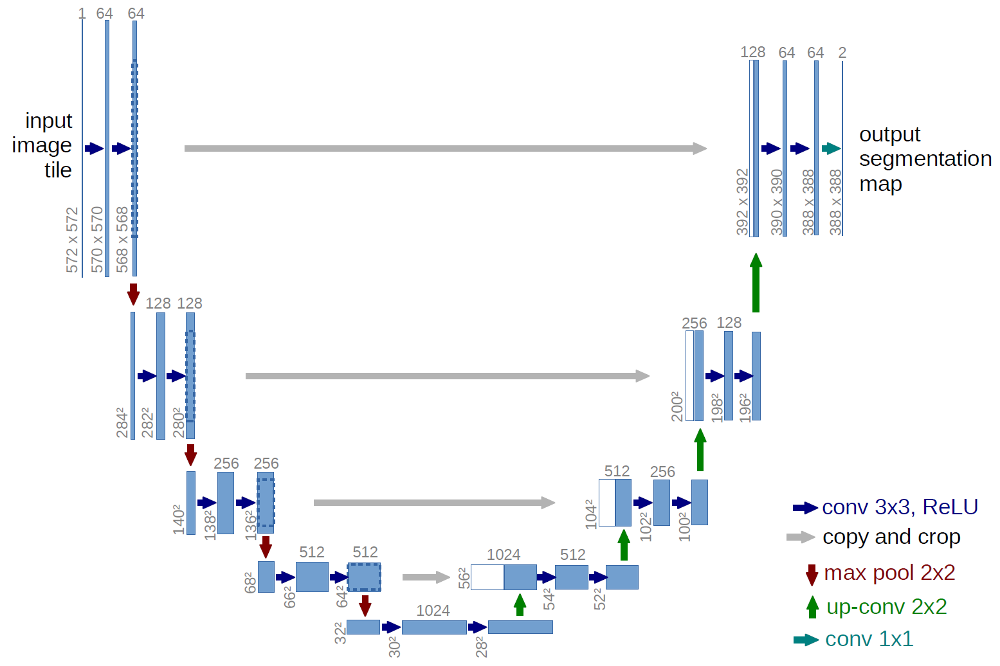

In [64]:
class Block(nn.Module):
	"""
	The single block unit
	"""
	def __init__(self, inChannels, outChannels):
		super().__init__()
		self.conv1 = nn.Conv2d(inChannels, outChannels, 3)
		self.relu = nn.ReLU()
		self.conv2 = nn.Conv2d(outChannels, outChannels, 3)

	def forward(self, x):
		"""
		The forward step
		"""
		return self.conv2(self.relu(self.conv1(x)))

In [65]:
class Encoder(nn.Module):
	"""
	The encoder phase of U-NET architecture
	"""
	def __init__(self, channels=(3, 16, 32, 64)):
		super().__init__()
		self.encBlocks = nn.ModuleList(
			[Block(channels[i], channels[i + 1]) for i in range(len(channels) - 1)]
		)
		self.pool = nn.MaxPool2d(2)

	def forward(self, x):
		"""
		The forward step
		"""
		blockOutputs = []
		for block in self.encBlocks:
			x = block(x)
			blockOutputs.append(x)
			x = self.pool(x)
		return blockOutputs

In [66]:
class Decoder(nn.Module):
	# The decoder phase of U-NET architecture
	def __init__(self, channels=(64, 32, 16)):
		super().__init__()
		self.channels = channels
		self.upconvs = nn.ModuleList(
			[nn.ConvTranspose2d(channels[i], channels[i + 1], 2, 2)
				for i in range(len(channels) - 1)]
		)
		self.dec_blocks = nn.ModuleList(
			[Block(channels[i], channels[i + 1]) for i in range(len(channels) - 1)]
		)

	def forward(self, x, encFeatures):
		# The forward step
		for i in range(len(self.channels) - 1):
			x = self.upconvs[i](x)
			encFeat = self.crop(encFeatures[i], x)
			x = torch.cat([x, encFeat], dim=1)
			x = self.dec_blocks[i](x)
		return x

	def crop(self, encFeatures, x):
		# Image centering and cropping
		(_, _, H, W) = x.shape
		encFeatures = CenterCrop([H, W])(encFeatures)
		return encFeatures

In [67]:
class UNet(nn.Module):
	"""
	The U-NET architecture
	"""
	def __init__(
		self, outSize, encChannels=(3, 16, 32, 64),
		decChannels=(64, 32, 16), retainDim=True
	):
		super().__init__()
		self.encoder = Encoder(encChannels)
		self.decoder = Decoder(decChannels)
		self.head = nn.Conv2d(decChannels[-1], 1, 1)
		self.retainDim = retainDim
		self.outSize = outSize

	def forward(self, x):
		"""
		The forward step
		"""
		encFeatures = self.encoder(x)
		decFeatures = self.decoder(encFeatures[::-1][0], encFeatures[::-1][1:])
		myMap = self.head(decFeatures)
		if self.retainDim:
			myMap = F.interpolate(myMap, self.outSize)
		return myMap

## **Model predictions**


Defining helper functions.

In [68]:
PIN_MEMORY = True if device == 'cuda' else False
THRESHOLD = 0.5

transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.PILToTensor(),
    transforms.ConvertImageDtype(torch.float)
])

In [69]:
def plot_result(origImage, origMask, predMask, idImage):
    fig, (ax1,ax2,ax3) = plt.subplots(1, 3, figsize=(18, 8))
    ax1.imshow(origImage)
    ax2.imshow(origMask)
    ax3.imshow(predMask)
    ax1.set_title('Original Image #'+str(idImage))
    ax2.set_title('Original Mask')
    ax3.set_title('Predicted Mask')
    ax1.set_xticks([])
    ax1.set_yticks([])
    ax2.set_xticks([])
    ax2.set_yticks([])
    ax3.set_xticks([])
    ax3.set_yticks([])
    fig.tight_layout()
    fig.show()

In [70]:
def make_predictions(model, testImgPath):
    image = io.imread(testImgPath)
    image = transform(image)
    image = image.unsqueeze(0)
    model.eval()
    with torch.no_grad():
        predMask = model(image.to(device)).squeeze()
        predMask = torch.sigmoid(predMask)
        predMask = predMask.cpu().numpy()
        predMask = (predMask > THRESHOLD) * 255
        predMask = predMask.astype(np.uint8)
    return predMask

Read a previously trained model.

In [71]:
if not os.path.exists('my_unet_model.pth'):
    os.system('wget %s'%BEST_MODEL)
saved_model = torch.load('my_unet_model.pth', map_location=torch.device(device))

Computing all testing set prediction and showing a sample.

In [72]:
ko = '.DS_Store'
test_i = os.listdir(PROCESSED[0])
test_m = os.listdir(PROCESSED[1])
if ko in test_i: test_i.remove(ko)
if ko in test_m: test_m.remove(ko)

# contains paths
testImages = [PROCESSED[0]+i for i in test_i]
# contains BW images
testMasks = [io.imread(PROCESSED[1]+i) for i in test_m]
testPred = []
testPred_cluster = []

for i in range(len(testImages)):
    pred = make_predictions(saved_model, testImages[i])
    _, pred_cluster = clustering_segmentation(applyGreenFilter(io.imread(testImages[i])))
    testPred.append(pred)
    testPred_cluster.append(pred_cluster)

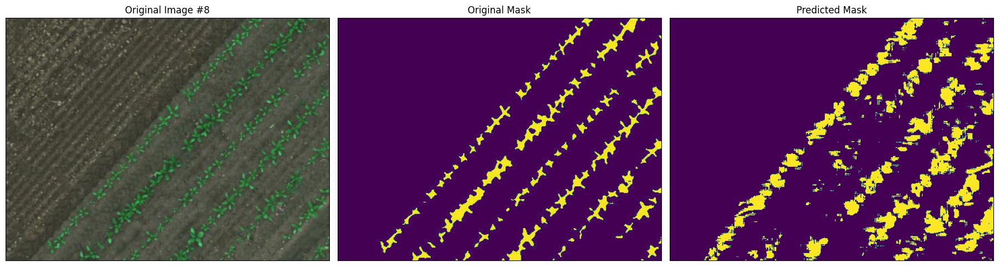

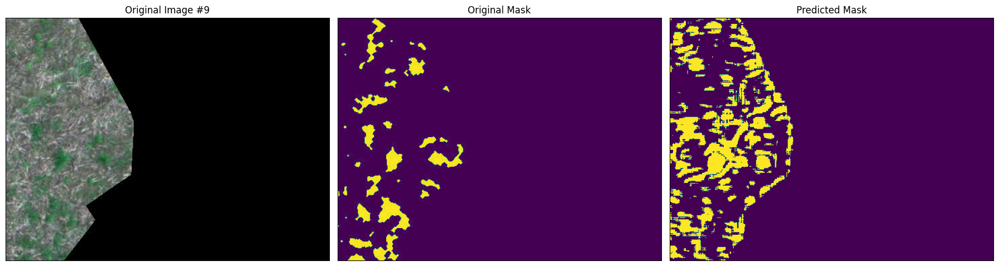

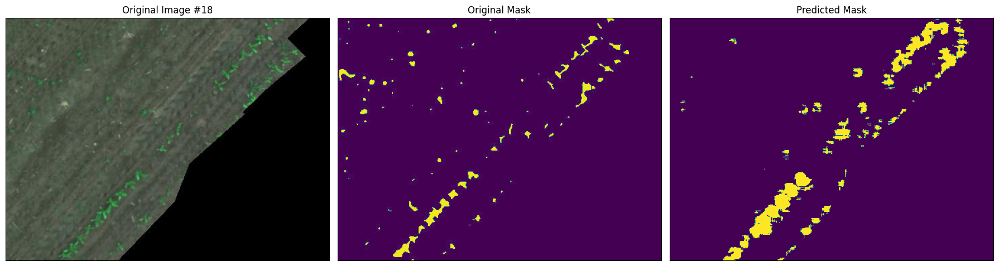

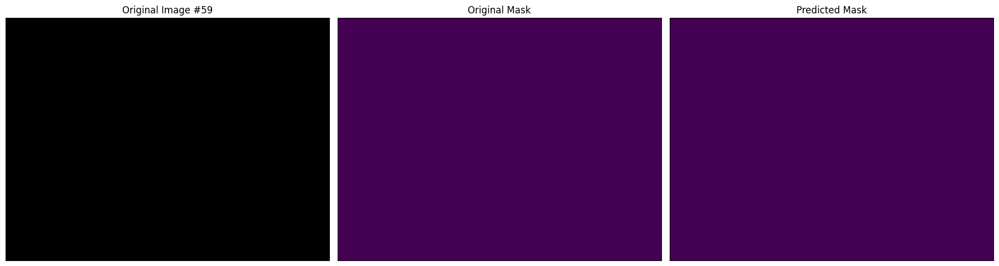

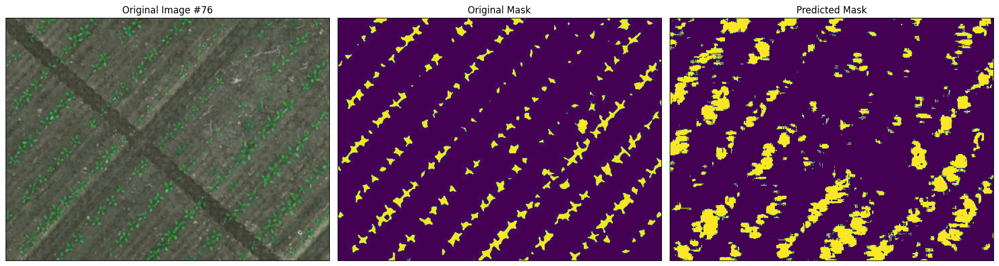

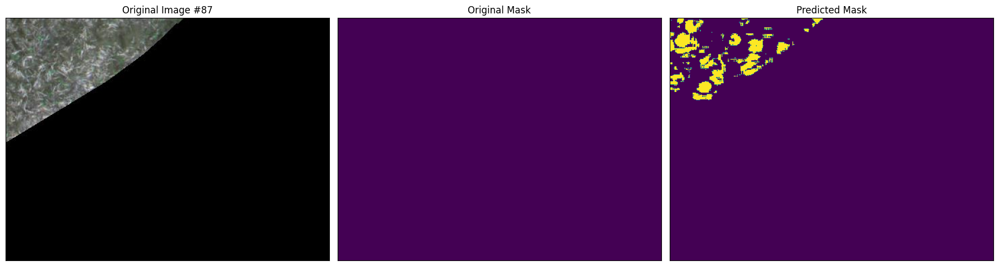

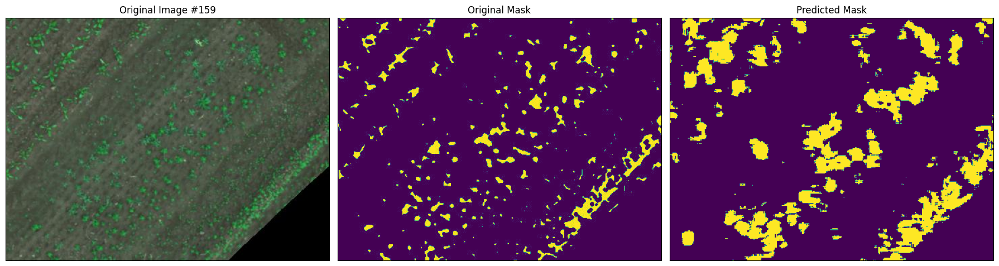

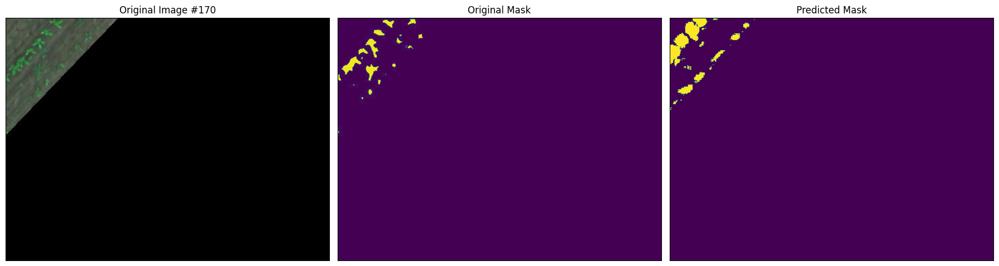

In [73]:
for i in [8,9,18,59,76,87,159,170]:
    plot_result(io.imread(testImages[i]), testMasks[i], testPred[i], i)